In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import matplotlib.pyplot as plt
import warnings

plt.style.use('seaborn')
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
import pandas as pd
import numpy as np
import yfinance as yf

In [4]:
# 데이터 다운로드
df_yahoo = yf.download('AAPL',
                      start = '2000-01-01',
                      end = '2010-12-31',
                      progress=False)

In [5]:
df_yahoo

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
1999-12-31,0.901228,0.918527,0.888393,0.917969,0.790705,163811200
2000-01-03,0.936384,1.004464,0.907924,0.999442,0.860883,535796800
2000-01-04,0.966518,0.987723,0.903460,0.915179,0.788302,512377600
2000-01-05,0.926339,0.987165,0.919643,0.928571,0.799837,778321600
2000-01-06,0.947545,0.955357,0.848214,0.848214,0.730621,767972800
...,...,...,...,...,...,...
2010-12-23,11.607143,11.612500,11.541786,11.557143,9.954899,223157200
2010-12-27,11.530357,11.622857,11.482857,11.595714,9.988124,249816000
2010-12-28,11.639643,11.666429,11.609286,11.623929,10.012430,175924000


Quandle API = 5rVyyK5Tysrsx3RgHdYx

In [6]:
import quandl

In [7]:
QUANDL_KEY = '5rVyyK5Tysrsx3RgHdYx'
quandl.ApiConfig.api_key = QUANDL_KEY

In [8]:
df_quandl = quandl.get(dataset = 'WIKI/AAPL',
                      start_date = '2000-01-01',
                      end_date = '2010-12-31')

In [9]:
df_quandl

,Open,High,Low,Close,Volume,Ex-Dividend,Split Ratio,Adj. Open,Adj. High,Adj. Low,Adj. Close,Adj. Volume
Date,,,,,,,,,,,,
2000-01-03,104.8700,112.50,101.69,111.94,4783900.0,0.0,1.0,3.369314,3.614454,3.267146,3.596463,133949200.0
2000-01-04,108.2500,110.62,101.19,102.50,4574800.0,0.0,1.0,3.477908,3.554053,3.251081,3.293170,128094400.0
2000-01-05,103.7500,110.56,103.00,104.00,6949300.0,0.0,1.0,3.333330,3.552125,3.309234,3.341362,194580400.0
2000-01-06,106.1200,107.00,95.00,95.00,6856900.0,0.0,1.0,3.409475,3.437748,3.052206,3.052206,191993200.0
2000-01-07,96.5000,101.00,95.50,99.50,4113700.0,0.0,1.0,3.100399,3.244977,3.068270,3.196784,115183600.0
...,...,...,...,...,...,...,...,...,...,...,...,...
2010-12-27,322.8519,325.44,321.52,324.68,8922000.0,0.0,1.0,41.490969,41.823576,41.319801,41.725905,62454000.0
2010-12-28,325.9102,326.66,325.06,325.47,6283000.0,0.0,1.0,41.884003,41.980363,41.774741,41.827431,43981000.0
2010-12-29,326.2200,326.45,325.10,325.29,5826400.0,0.0,1.0,41.923817,41.953375,41.779881,41.804299,40784800.0


주가를 수익률로 바꾸기

In [10]:
df = yf.download('AAPL',
                      start = '2000-01-01',
                      end = '2010-12-31',
                      progress=False)
df = df.loc[:, ['Adj Close']]
df.rename(columns={ 'Adj Close':'adj_close'}, inplace=True)

In [11]:
df

,adj_close
Date,
1999-12-31,0.790705
2000-01-03,0.860883
2000-01-04,0.788302
2000-01-05,0.799837
2000-01-06,0.730621
...,...
2010-12-23,9.954899
2010-12-27,9.988124
2010-12-28,10.012430


In [12]:
df['simple_rtn'] = df.adj_close.pct_change()
df['log_rtn'] = np.log(df.adj_close/df.adj_close.shift(1))

In [13]:
df

,adj_close,simple_rtn,log_rtn
Date,,,
1999-12-31,0.790705,NaN,NaN
2000-01-03,0.860883,0.088754,0.085033
2000-01-04,0.788302,-0.084310,-0.088077
2000-01-05,0.799837,0.014633,0.014527
2000-01-06,0.730621,-0.086538,-0.090514
...,...,...,...
2010-12-23,9.954899,-0.004798,-0.004809
2010-12-27,9.988124,0.003338,0.003332
2010-12-28,10.012430,0.002434,0.002431


물가 상승을 고려한 수익률 계산

In [14]:
QUANDL_KEY = '5rVyyK5Tysrsx3RgHdYx'
quandl.ApiConfig.api_key = QUANDL_KEY

In [15]:
df_all_dates = pd.DataFrame(index=pd.date_range(start='1999-12-31',
                                               end = '2010-12-31'))
df = df_all_dates.join(df[['adj_close']], how='left').fillna(method='ffill').asfreq('M')

In [16]:
df

,adj_close
1999-12-31,0.790705
2000-01-31,0.797914
2000-02-29,0.881552
2000-03-31,1.044500
2000-04-30,0.954133
...,...
2010-08-31,7.478480
2010-09-30,8.728997
2010-10-31,9.259040
2010-11-30,9.571903


In [17]:
df_cpi = quandl.get(dataset='RATEINF/CPI_USA',
                   start_date='1999-12-01',
                   end_date='2010-12-31')
df_cpi.rename(columns={'Value':'cpi'}, inplace=True)

In [18]:
df_cpi

,cpi
Date,
1999-12-31,168.300
2000-01-31,168.800
2000-02-29,169.800
2000-03-31,171.200
2000-04-30,171.300
...,...
2010-08-31,218.312
2010-09-30,218.439
2010-10-31,218.711


In [19]:
df_merged = df.join(df_cpi, how='left')

In [20]:
df_merged

,adj_close,cpi
1999-12-31,0.790705,168.300
2000-01-31,0.797914,168.800
2000-02-29,0.881552,169.800
2000-03-31,1.044500,171.200
2000-04-30,0.954133,171.300
...,...,...
2010-08-31,7.478480,218.312
2010-09-30,8.728997,218.439
2010-10-31,9.259040,218.711
2010-11-30,9.571903,218.803


In [21]:
df_merged['simple_rtn'] = df_merged.adj_close.pct_change()
df_merged['inflation_rate'] = df_merged.cpi.pct_change()

In [22]:
df_merged['real_rtn'] = (df_merged.simple_rtn + 1) / (df_merged.inflation_rate + 1) -1

In [23]:
df_merged

,adj_close,cpi,simple_rtn,inflation_rate,real_rtn
1999-12-31,0.790705,168.300,NaN,NaN,NaN
2000-01-31,0.797914,168.800,0.009118,0.002971,0.006129
2000-02-29,0.881552,169.800,0.104820,0.005924,0.098314
2000-03-31,1.044500,171.200,0.184842,0.008245,0.175153
2000-04-30,0.954133,171.300,-0.086517,0.000584,-0.087050
...,...,...,...,...,...
2010-08-31,7.478480,218.312,-0.055005,0.001381,-0.056308
2010-09-30,8.728997,218.439,0.167215,0.000582,0.166537
2010-10-31,9.259040,218.711,0.060722,0.001245,0.059403
2010-11-30,9.571903,218.803,0.033790,0.000421,0.033355


In [24]:
def realized_volatility(x):
    return np.sqrt(np.sum(x**2))

In [25]:
df_rv = df.groupby(pd.Grouper(freq='M')).apply(realized_volatility)
df_rv.rename(columns={'log_rtn': 'rv'}, inplace=True)

In [26]:
df_rv.rv = df_rv.rv * np.sqrt(12)

AttributeError: 'DataFrame' object has no attribute 'rv'

In [ ]:
df_rv

In [ ]:
fig, ax = plt.subplots(2, 1, sharex=True)
ax[0].plot(df.log_rtn)
ax[1].plot(df_rv.rv)

Visualizing time series data

In [27]:
import pandas as pd
import yfinance as yf

df = yf.download('MSFT', auto_adjust=False, progress=False)
df = df.loc[:, ['Adj Close']]
df.rename(columns={'Adj Close': 'adj_close'}, inplace=True)

In [28]:
df['simple_rtn'] = df.adj_close.pct_change()
df['log_rtn'] = np.log(df.adj_close / df.adj_close.shift(1))

df.dropna(how = 'any', inplace = True)

In [29]:
fig, ax = plt.subplots(3, 1, figsize=(24, 30), sharex=False)

df.adj_close.plot(ax=ax[0])
ax[0].set(title = 'MSFT time series',
         ylabel = 'Stock price ($)')
df.simple_rtn.plot(ax=ax[1])
ax[1].set(ylabel = 'Simple returen (%)')

df.log_rtn.plot(ax=ax[2])
ax[2].set(xlabel = 'Date',
         ylabel = 'Log returns (%)')

[Text(0, 0.5, 'Log returns (%)'), Text(0.5, 0, 'Date')]

In [30]:
import cufflinks as cf
from plotly.offline import iplot, init_notebook_mode

# cf.set_config_file(world_readable=True, theme='pearl', offline=True)

init_notebook_mode()

In [31]:
df.iplot(subplots=True, shape=(3,1), shared_xaxes=True,
        title='MSFT time series')

특이값 식별

In [39]:
import pandas as pd
import yfinance as yf

df = yf.download('AAPL',
                start = '2000-01-01',
                end = '2010-12-31')

[*********************100%***********************]  1 of 1 completed


In [40]:
df = df.loc[:,['Adj Close']]
df.rename(columns={'Adj Close': 'adj_close'}, inplace=True)

In [42]:
df['simple_rtn'] = df.adj_close.pct_change()

In [43]:
df.head()

,adj_close,simple_rtn
Date,,
1999-12-31,0.790705,NaN
2000-01-03,0.860883,0.088754
2000-01-04,0.788302,-0.084310
2000-01-05,0.799837,0.014633
2000-01-06,0.730621,-0.086538


In [44]:
df_rolling = df[['simple_rtn']].rolling(window=21).agg(['mean','std'])
df_rolling.columns = df_rolling.columns.droplevel()

In [45]:
df_outliers = df.join(df_rolling)

In [47]:
def indentify_outliers(row, n_sigmas=3):
    x = row['simple_rtn']
    mu = row['mean']
    sigma = row['std']
    if (x > mu + 3 * sigma) | (x < mu - 3 * sigma):
        return 1
    else:
        return 0

In [49]:
df_outliers['outlier'] = df_outliers.apply(indentify_outliers, axis=1)
outliers = df_outliers.loc[df_outliers['outlier'] == 1, ['simple_rtn']]

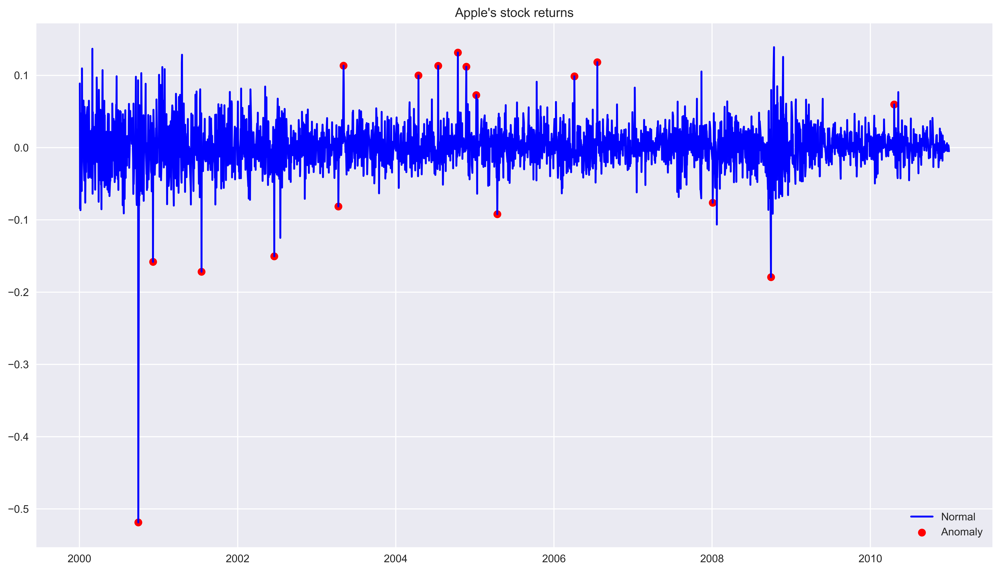

In [52]:
fig, ax = plt.subplots()

ax.plot(df_outliers.index, df_outliers.simple_rtn, color='blue', label='Normal')
ax.scatter(outliers.index, outliers.simple_rtn, color='red', label='Anomaly')
ax.set_title("Apple's stock returns")
ax.legend(loc='lower right')

자산 수익의 정형화된 사실 조사

In [56]:
import pandas as pd
import numpy as np
import yfinance as yf
import seaborn as sns
import scipy.stats as scs
import statsmodels.api as sm
import statsmodels.tsa.api as smt

In [58]:
df = yf.download('^GSPC',
                start = '1985-01-01',
                end = '2018-12-31',
                progress=False)

df = df[['Adj Close']].rename(columns={'Adj Close':'adj_close'})
df['log_rtn'] = np.log(df.adj_close/df.adj_close.shift(1))
df = df[['adj_close', 'log_rtn']].dropna(how = 'any')

In [59]:
r_range = np.linspace(min(df.log_rtn), max(df.log_rtn), num=1000)
mu = df.log_rtn.mean()
sigma = df.log_rtn.std()
norm_pdf = scs.norm.pdf(r_range, loc=mu, scale=sigma)

Text(0.5, 1.0, 'Q-Q plot')

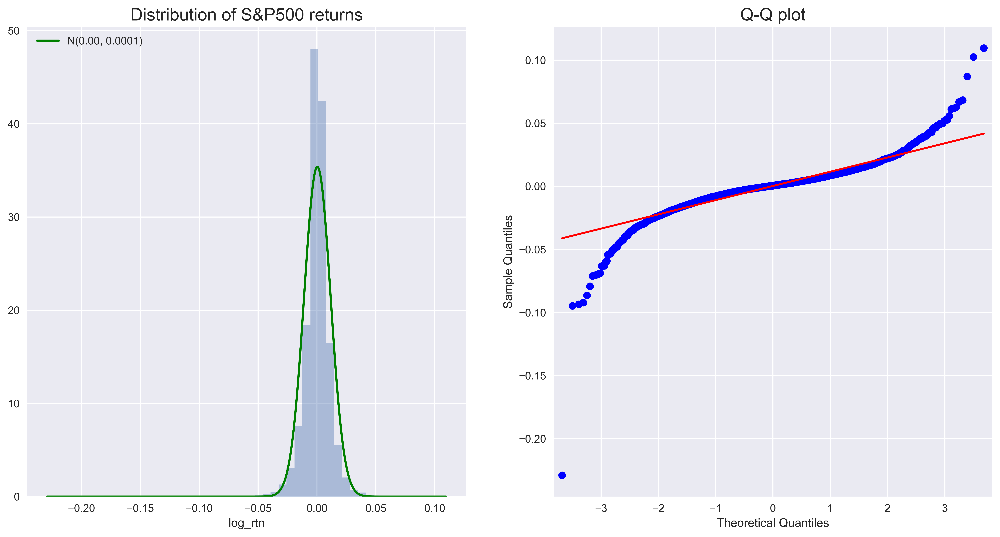

In [60]:
fig, ax = plt.subplots(1, 2, figsize=(16,8))

sns.distplot(df.log_rtn, kde=False, norm_hist=True, ax=ax[0])
ax[0].set_title('Distribution of S&P500 returns', fontsize=16)
ax[0].plot(r_range, norm_pdf, 'g', lw=2, label=f'N({mu:.2f}, {sigma**2:.4f})')
ax[0].legend(loc='upper left')

qq = sm.qqplot(df.log_rtn.values, line='s', ax=ax[1])
ax[1].set_title('Q-Q plot', fontsize = 16)

In [61]:
jb_test = scs.jarque_bera(df.log_rtn.values)

print('---------- Descriptive Statistics ----------')
print('Range of dates:', min(df.index.date), '-', max(df.index.date))
print('Number of observations:', df.shape[0])
print(f'Mean: {df.log_rtn.mean():.4f}')
print(f'Median: {df.log_rtn.median():.4f}')
print(f'Min: {df.log_rtn.min():.4f}')
print(f'Max: {df.log_rtn.max():.4f}')
print(f'Standard Deviation: {df.log_rtn.std():.4f}')
print(f'Skewness: {df.log_rtn.skew():.4f}')
print(f'Kurtosis: {df.log_rtn.kurtosis():.4f}') 
print(f'Jarque-Bera statistic: {jb_test[0]:.2f} with p-value: {jb_test[1]:.2f}')

---------- Descriptive Statistics ----------
Range of dates: 1985-01-02 - 2018-12-28
Number of observations: 8569
Mean: 0.0003
Median: 0.0006
Min: -0.2290
Max: 0.1096
Standard Deviation: 0.0113
Skewness: -1.2624
Kurtosis: 28.0111
Jarque-Bera statistic: 282076.61 with p-value: 0.00


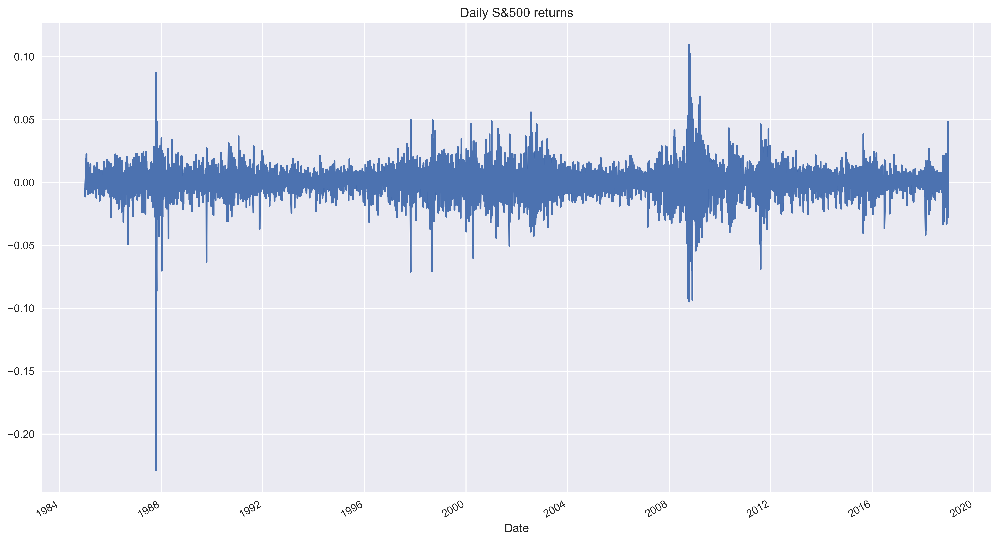

In [62]:
df.log_rtn.plot(title='Daily S&500 returns')

In [63]:
N_LAGS = 50
SIGNIFICANCE_LEVEL = 0.05

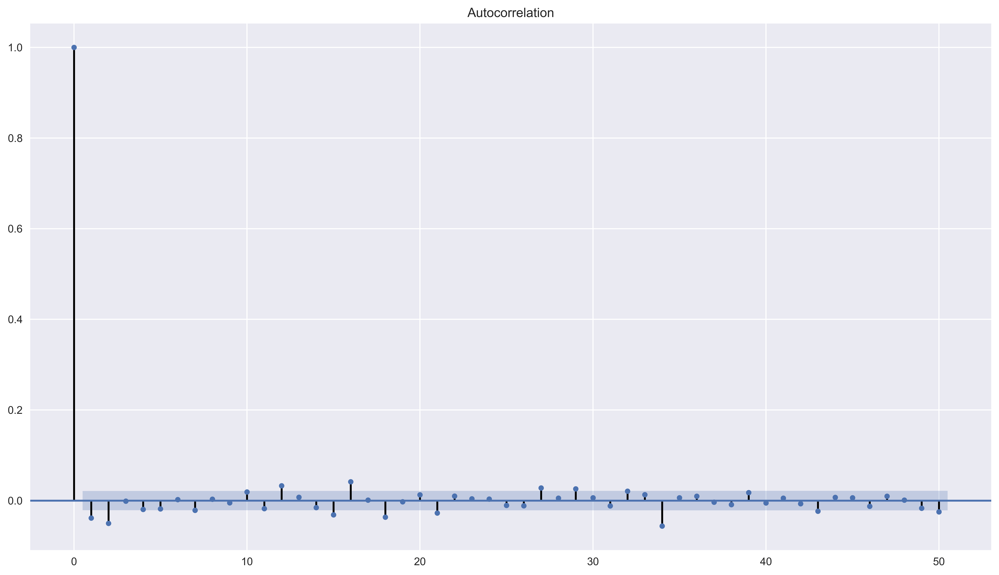

In [64]:
acf = smt.graphics.plot_acf(df.log_rtn,
                           lags=N_LAGS,
                           alpha=SIGNIFICANCE_LEVEL)

[Text(0, 0.5, 'Absolute Returns'), Text(0.5, 0, 'Lag')]

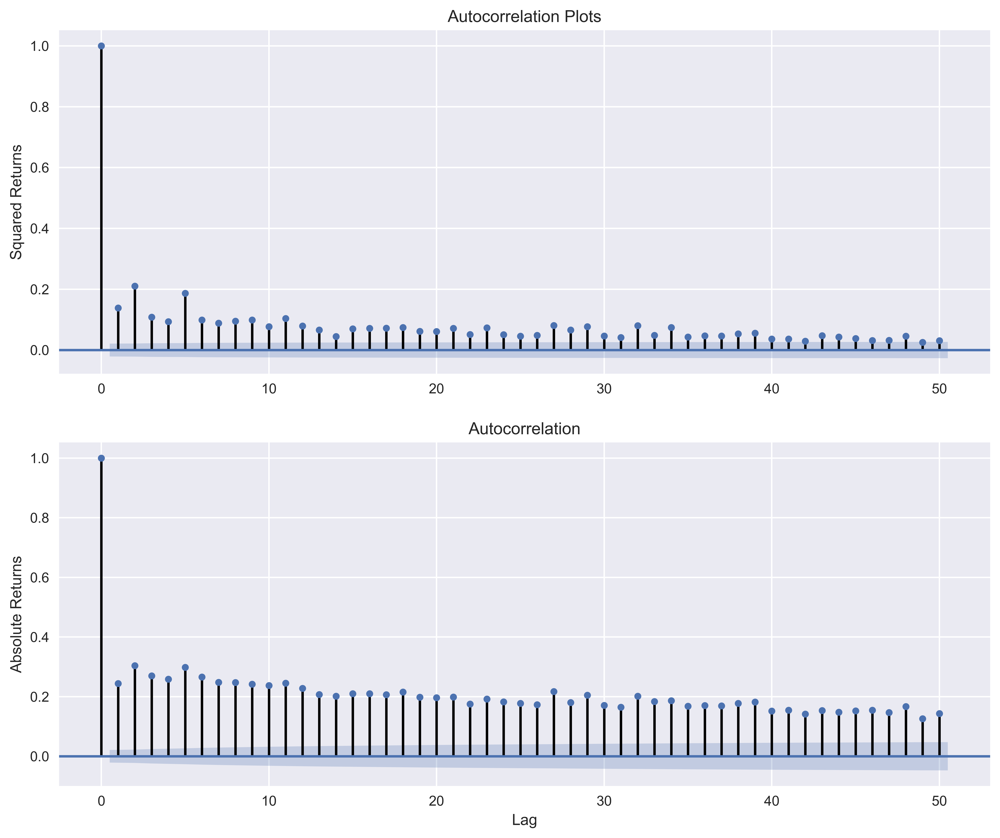

In [67]:
fig, ax = plt.subplots(2, 1, figsize=(12, 10))

smt.graphics.plot_acf(df.log_rtn ** 2, lags=N_LAGS,
                     alpha=SIGNIFICANCE_LEVEL, ax = ax[0])
ax[0].set(title="Autocorrelation Plots",
         ylabel='Squared Returns')

smt.graphics.plot_acf(np.abs(df.log_rtn), lags=N_LAGS,
                     alpha=SIGNIFICANCE_LEVEL, ax = ax[1])
ax[1].set(ylabel='Absolute Returns',
         xlabel='Lag')

In [70]:
df['moving_std_252'] = df[['log_rtn']].rolling(window=252).std()
df['moving_std_21'] = df[['log_rtn']].rolling(window=21).std()

In [71]:
fig, ax = plt.subplots( 3, 1, figsize=(18, 15), sharex=True)

df.adj_close.plot(ax=ax[0])
ax[0].set(title='MSFT time series', ylabel='Stock price ($)')

df.log_rtn.plot(ax=ax[1])
ax[1].set(ylabel='Log returns (%)')

df.moving_std_252.plot(ax=ax[2], color='r', label='Moving Volatility 252d')
df.moving_std_21.plot(ax=ax[2], color='g', label='Moving Volatility 21d')
ax[2].set(ylabel='Moving Volatility', xlabel='Date')
ax[2].legend()

In [72]:
df = yf.download(['^GSPC','^VIX'],
                start = '1985-01-01',
                end='2018-12-31',
                progress=False)
df = df[['Adj Close']]
df.columns = df.columns.droplevel(0)
df = df.rename(columns={'^GSPC':'sp500', '^VIX':'vix'})

In [73]:
df['log_rtn'] = np.log(df.sp500/df.sp500.shift(1))
df['vol_rtn'] = np.log(df.vix/df.vix.shift(1))
df.dropna(how = 'any', axis = 0, inplace=True)

[Text(0, 0.5, 'VIX log returns'),
 Text(0.5, 0, 'S&P 500 log returns'),
 Text(0.5, 1.0, 'S&P 500 vs. VIX ($\\rho$ = -0.71)')]

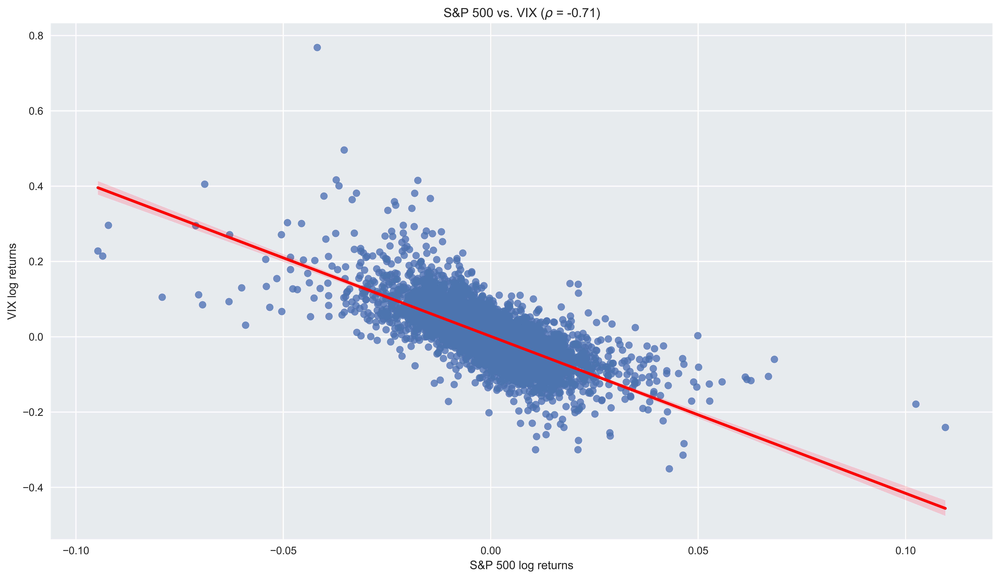

In [74]:
corr_coeff = df.log_rtn.corr(df.vol_rtn)

ax = sns.regplot(x = 'log_rtn', y='vol_rtn', data=df, line_kws={'color':'red'})
ax.set(title=f'S&P 500 vs. VIX ($\\rho$ = {corr_coeff:.2f})',
      ylabel='VIX log returns',
      xlabel='S&P 500 log returns')